In [1]:
import os
from pathlib import Path
# import pandas as pd
from copy import deepcopy
import numpy as np
from matplotlib.patches import Rectangle
# pd.set_option("display.max_rows", 100)
from dataclasses import dataclass
from dacite import from_dict, Config
# import xml.etree.ElementTree as ET
import cv2
import random
import sys
from pathlib import Path
sys.path.append("..")
from semif_utils.datasets import ImageData, BBox
from bbox.bbox_transformations import GlobalToLocalMaper
import rasterio
from semif_utils.utils import rescale_bbox
from rasterio.plot import show as rastershow
import matplotlib.pyplot as plt
%matplotlib inline
import json

In [2]:
trial = "NC_2022-03-11"

In [3]:
base_path = f"../data/semifield-developed-images/{trial}"
image_path = f"{base_path}/images"
orthomosaic_path = f"{base_path}/autosfm/ortho/orthomosaic.tif"
annotation_file_path = f"{base_path}/autosfm/detections.csv"
metadata_path = f"{base_path}/metadata"

In [4]:
# orthomosaic = rasterio.open(orthomosaic_path)

In [5]:
# box_metadata = dict()
# metadata_files = os.listdir(metadata_path)
# for file in metadata_files:
#     image_id = Path(file).stem
#     # image_id = file.split(".")[0]
#     filename = Path(metadata_path, file)
#     with open(filename, "r") as f:
#         contents = json.load(f)
#     box_metadata[image_id] = contents

In [6]:
def disp_orthomosaic():
    f, ax = plt.subplots(1, 1, dpi=200)
    rastershow(orthomosaic, ax=ax)
    plt.show()

In [7]:
# Utility plotting function to plot all the identified primary boxes
def plot_rectangle(image, display_orthomosaic=True, save=False, seed=42):
    
    import random
    random.seed(seed)
    
    f, ax = plt.subplots(1, 1, dpi=300)
    ax.set_aspect("equal", adjustable="box")
    
    if display_orthomosaic:
        rastershow(orthomosaic, ax=ax)
           
    r, g, b = random.random(), random.random()%0.5, random.random()
    img_color = (r, g, b, 0.05)
    linewidth = 1
    handle = ax.scatter(
        image.camera_info.camera_location[0], 
        image.camera_info.camera_location[1], 
        marker="x", color=img_color)

    labels = []
    handles = []
    
    for bbox in image.bboxes:

        r, g, b = random.random(), random.random(), random.random()
        color = (r, g, b, 1.0)
        linewidth = 1

        anchor = bbox.global_coordinates.bottom_left
        width = bbox.global_coordinates.top_right[0] - bbox.global_coordinates.top_left[0]
        height = bbox.global_coordinates.top_left[1] - bbox.global_coordinates.bottom_left[1]
        patch = Rectangle(anchor, width, height, facecolor="none", edgecolor=color, linewidth=linewidth, linestyle="--")
        ax.add_patch(patch)

        handles.append(handle)
        labels.append(bbox.bbox_id)
        
    ax.legend(handles, labels, ncol=5, loc="lower left", fontsize="xx-small", bbox_to_anchor=(0.8, 1.0))
    plt.show()
    plt.close()

In [8]:
def get_patch(bbox, img, color):
    anchor = deepcopy(bbox.local_coordinates.bottom_left)
    width =  bbox.local_coordinates.top_right[0] - bbox.local_coordinates.top_left[0]
    height = bbox.local_coordinates.top_left[1] -  bbox.local_coordinates.bottom_left[1]

    anchor[0] = anchor[0] * img.fullres_width
    anchor[1] = anchor[1] * img.fullres_height
    width = width * img.fullres_width
    height = height * img.fullres_height

    patch = Rectangle(anchor, width, height, facecolor="none", edgecolor=color, linewidth=1)
    
    return patch

def plot_local(images, image_id=None, save=False):
    
    _images = [img for img in images if img.image_id == image_id]
    
    for img in _images:
        
        img_path = Path("..", img.blob_home, img.data_root, img.batch_id,
                        img.image_path)

        f, ax = plt.subplots(1, 1, dpi=100)
        arr = cv2.imread(str(img_path))[:, :, ::-1]
        ax.imshow(arr)
        
        handles = []
        labels = []
        
        for bbox in img.bboxes:
            
            r, g, b = random.random(), random.random()%0.5, random.random()
            color = (r, g, b)
            
            patch = get_patch(bbox, img, color)
            handle = ax.add_patch(patch)
            
            handles.append(handle)
            labels.append(bbox.bbox_id)
            
        ax.legend(handles, labels, ncol=5, loc="lower left", fontsize="xx-small", bbox_to_anchor=(0.8, 1.0))
        ax.set_title(img.image_id)
        
        plt.show()
        plt.close()

def get_imagedata(json_list):
    images = []
    for meta in json_list:
        # Opening JSON file
        meta = Path(metadata_path, meta)
        with open(meta) as json_file:
            data = json.load(json_file)
            dc = from_dict(data_class=ImageData,
                                data=data,
                                config=Config(check_types=False))
            images.append(dc)
    return images


In [9]:


def compare_plot_local(img, external_bbox, save=False):
    
    img_path = Path("..", img.blob_home, img.data_root, img.batch_id,
                        img.image_path)

    f, ax = plt.subplots(1, 1, dpi=100)
    arr = cv2.imread(str(img_path))[:, :, ::-1]
    ax.imshow(arr)

    handles = []
    labels = []

    for bbox in img.bboxes:

        r, g, b = random.random(), random.random()%0.5, random.random()
        color = (r, g, b)

        patch = get_patch(bbox, img, color)
        handle = ax.add_patch(patch)

        handles.append(handle)
        labels.append(bbox.bbox_id)
        
    patch = get_patch(external_bbox, img, (1., 1., 1.))
    handle = ax.add_patch(patch)

    handles.append(handle)
    labels.append(bbox.bbox_id)
    
    ax.legend(handles, labels, ncol=5, loc="lower left", fontsize="xx-small", bbox_to_anchor=(0.8, 1.0))
    ax.set_title(img.image_id)

    plt.show()
    plt.close()

In [10]:
metas = sorted([x.name for x in Path(metadata_path).glob("*.json")])
images = get_imagedata(metas)

In [11]:
def map_and_plot(img, box, mapto_id, mapto_bbox):
    
    verify_img = [img for img in images if img.image_id == mapto_id][0]
    verify_bbox = [_box for _box in verify_img.bboxes if _box.bbox_id == mapto_bbox][0]

    global_box = BBox(box.bbox_id+"_global", box.image_id, box.cls, global_coordinates=box.global_coordinates)

    mapper = GlobalToLocalMaper(images)

    local_coordinates = mapper.map(global_box, map_to=mapto_id)
    global_box.local_coordinates = local_coordinates
    
    img = [img for img in images if img.image_id==mapto_id][0]
    compare_plot_local(img, global_box)
    plot_local(images, image_id=map_id)

row1_1_1_1647012872000.0


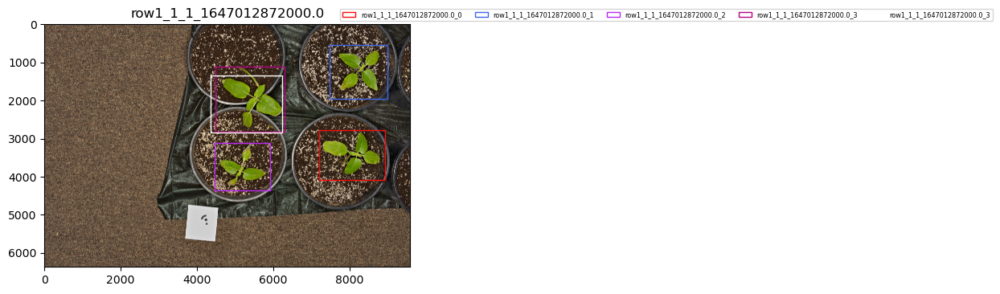

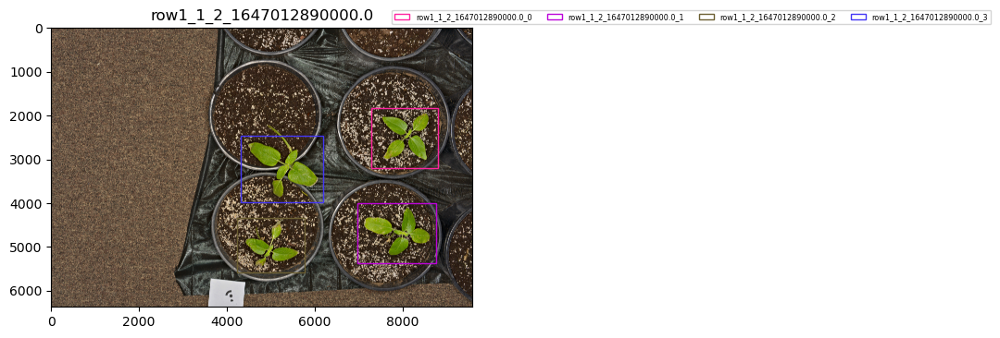

row2_2_3_1647013311000.0


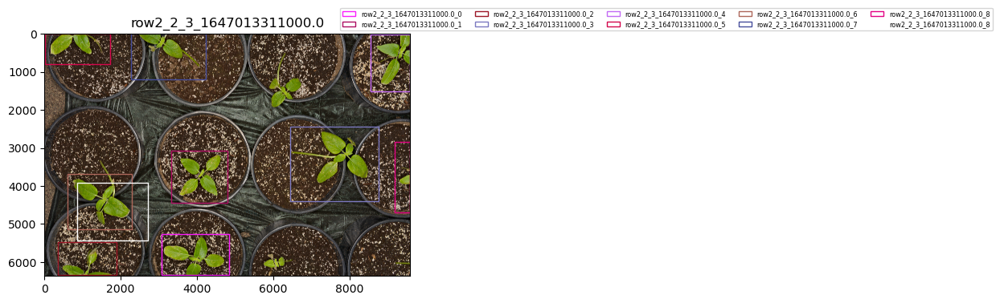

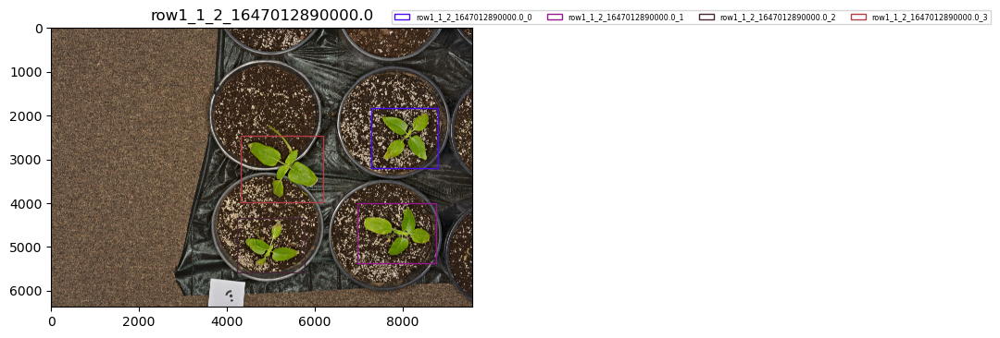

row1_1_4_1647012928000.0


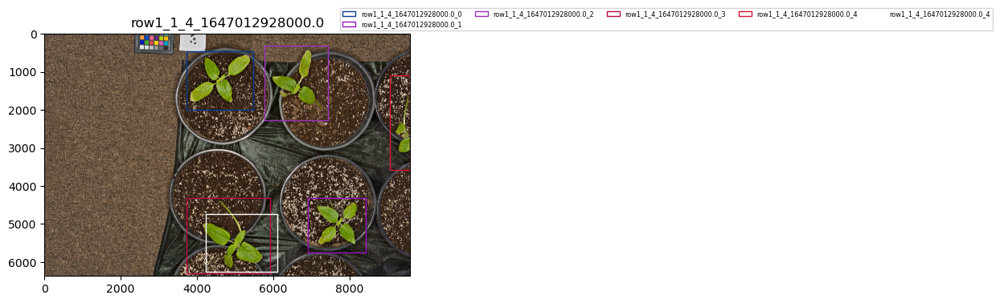

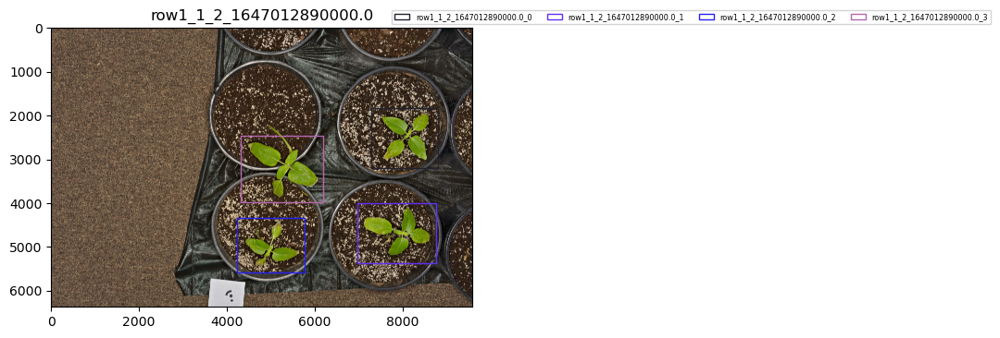

row1_1_3_1647012909000.0


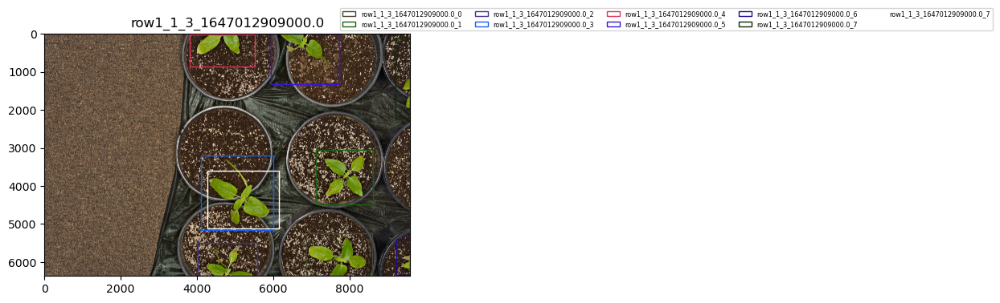

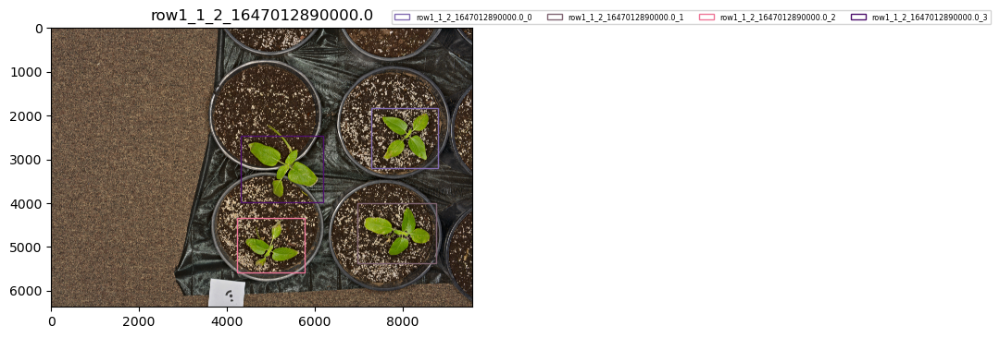

row2_2_4_1647013330000.0


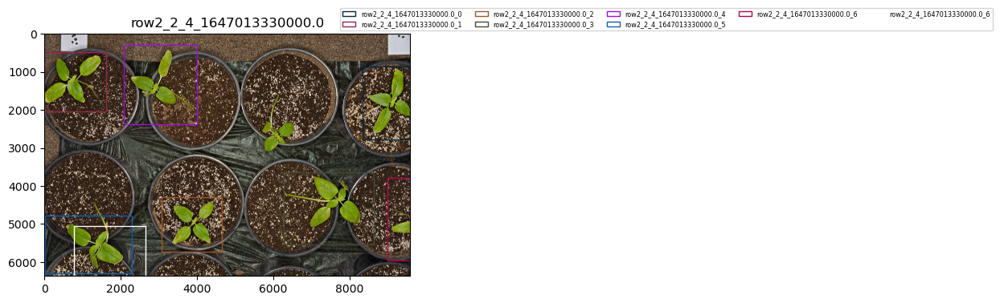

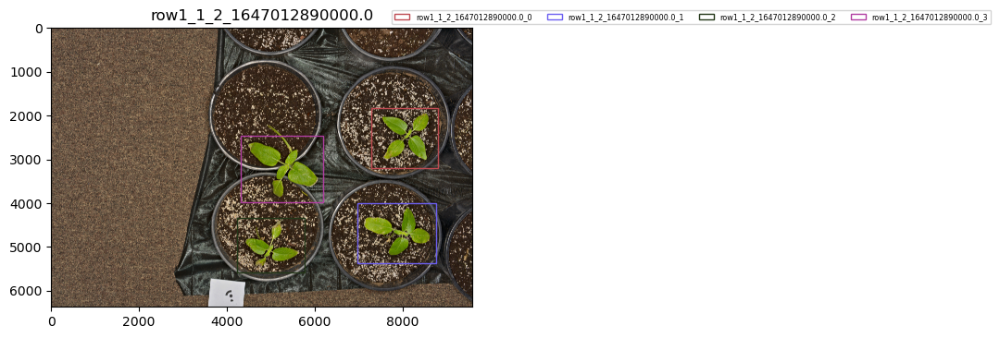

row2_2_1_1647013274000.0


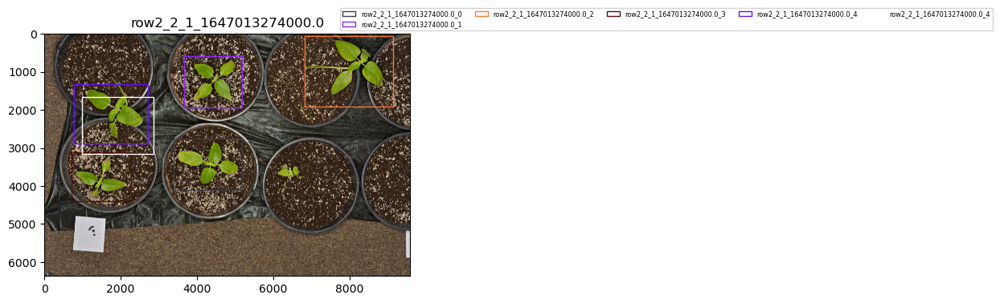

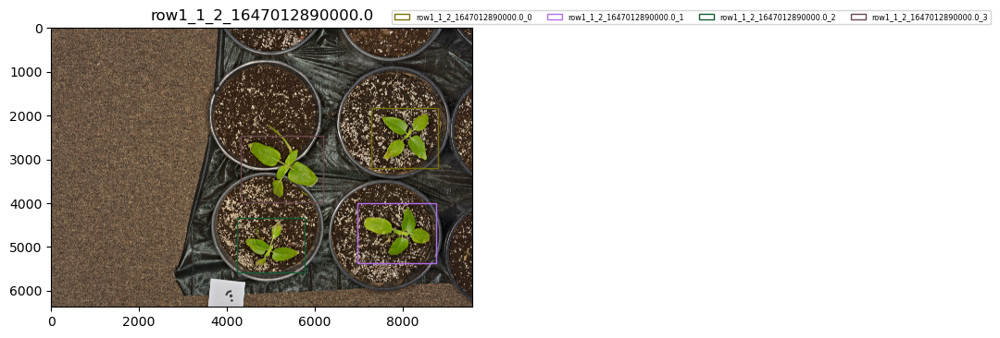

row2_2_2_1647013292000.0


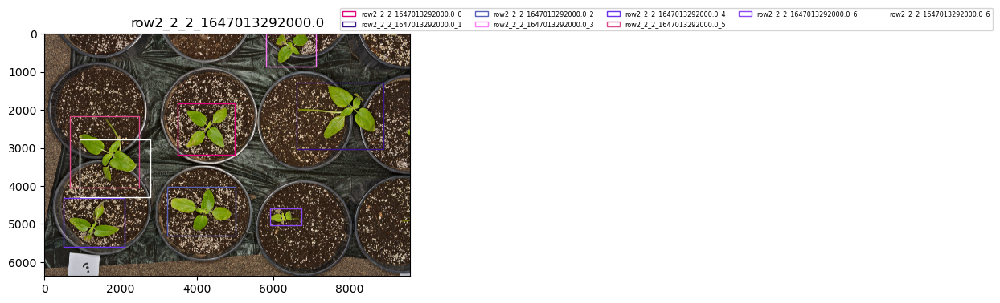

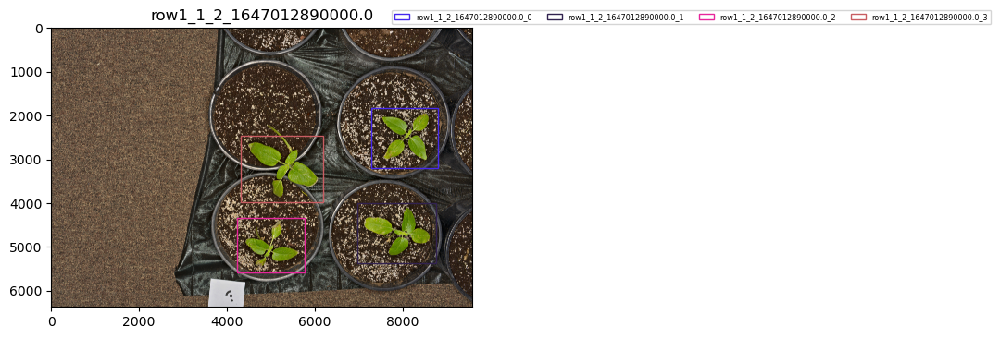

In [17]:
map_id = "row1_1_2_1647012890000.0"
map_bbox = "row1_1_2_1647012890000.0_3"

img = [img for img in images if img.image_id == map_id][0]
box = [_box for _box in img.bboxes if _box.bbox_id == map_bbox][0]

all_bbox_ids = box.overlapping_bbox_ids

for box_id in all_bbox_ids:
    
    mapto_id = box_id.rsplit("_", 1)[0]
    map_and_plot(img, box, mapto_id, box_id)

row1_1_2_1647012890000.0


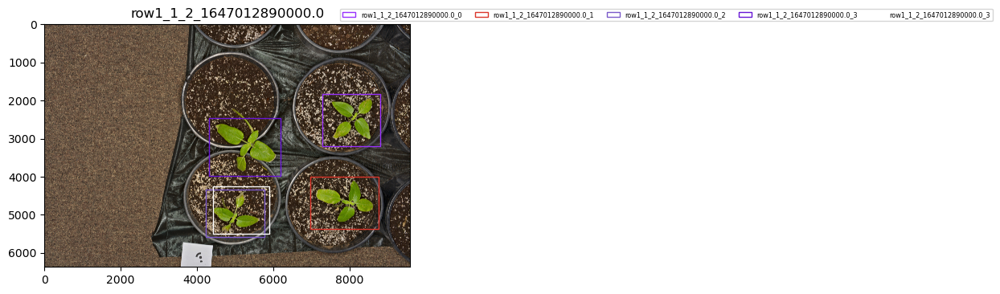

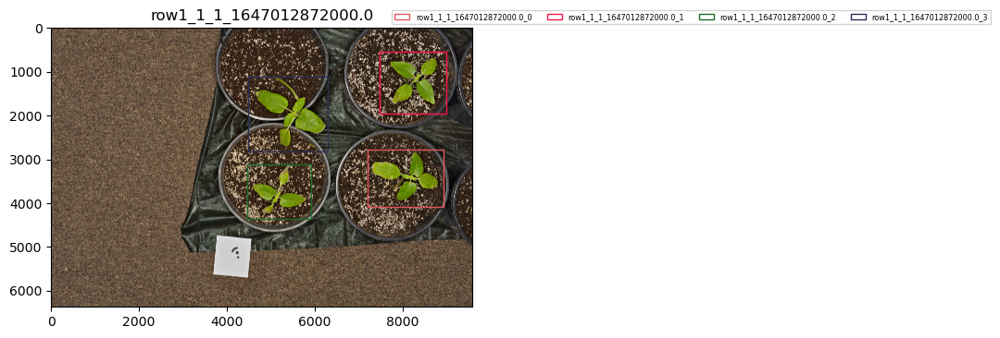

row1_1_3_1647012909000.0


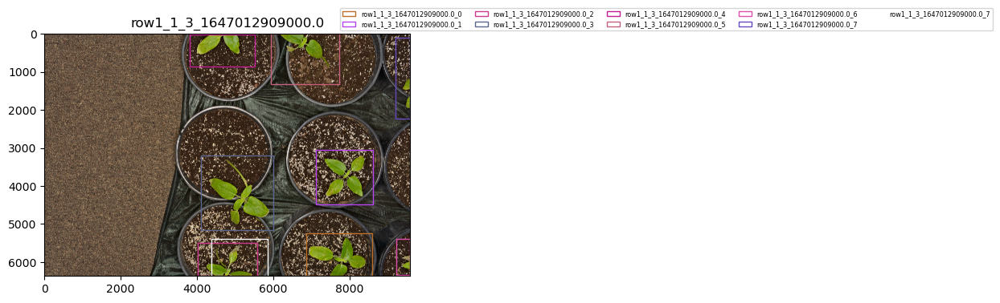

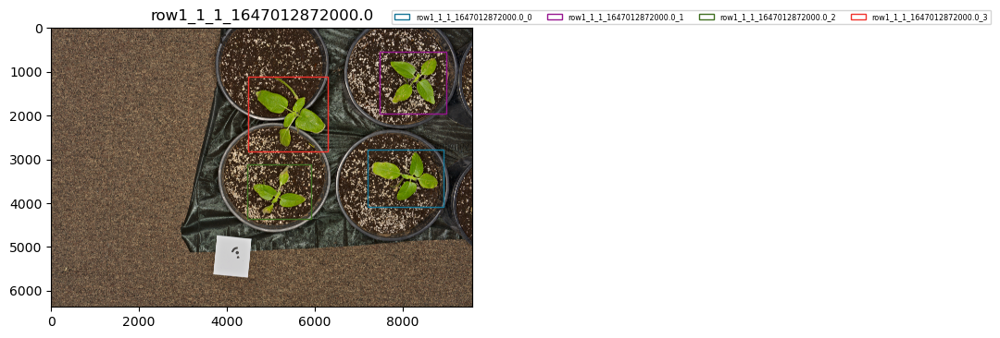

row2_2_1_1647013274000.0


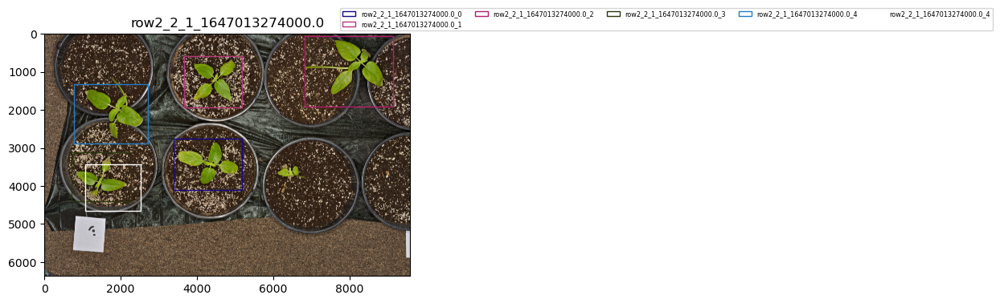

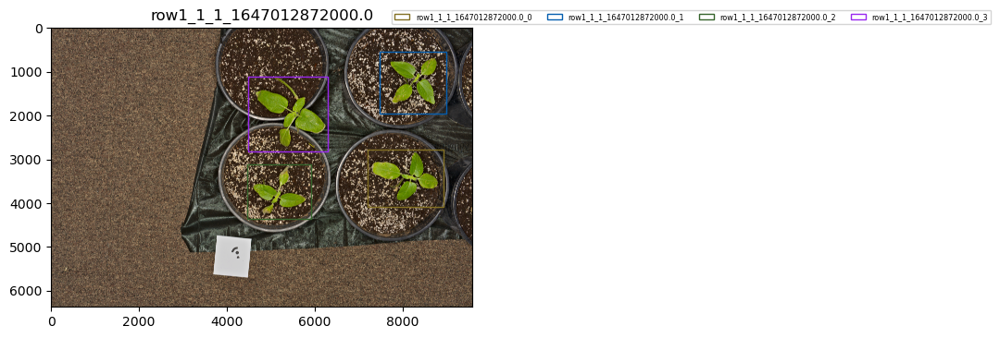

row2_2_2_1647013292000.0


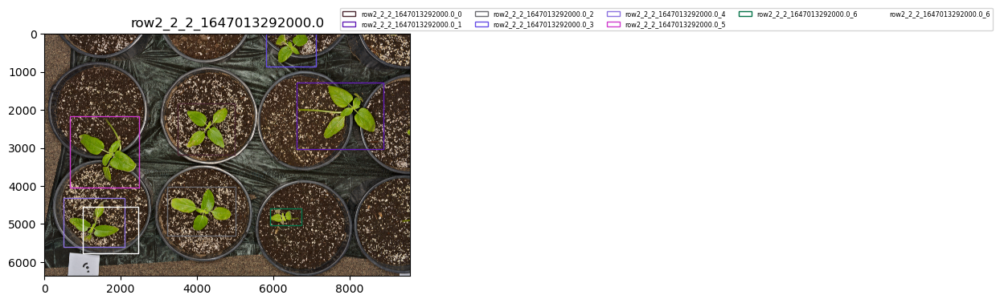

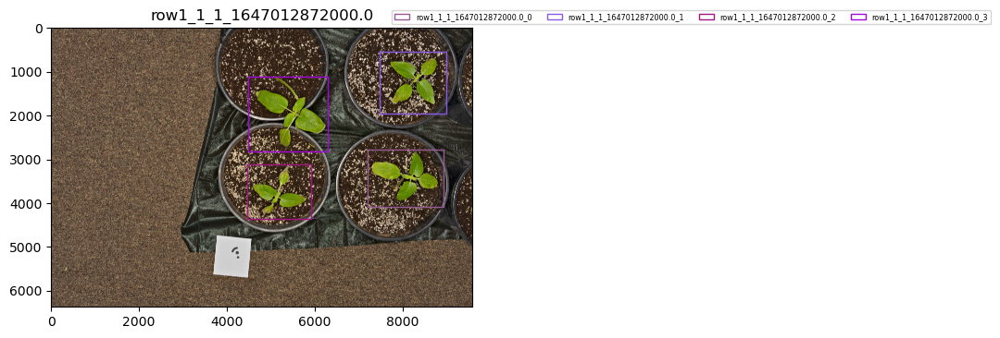

In [12]:
map_id = "row1_1_1_1647012872000.0"
map_bbox = "row1_1_1_1647012872000.0_2"

img = [img for img in images if img.image_id == map_id][0]
box = [_box for _box in img.bboxes if _box.bbox_id == map_bbox][0]

all_bbox_ids = box.overlapping_bbox_ids

for box_id in all_bbox_ids:
    
    mapto_id = box_id.rsplit("_", 1)[0]
    map_and_plot(img, box, mapto_id, box_id)

row2_2_3_1647013311000.0


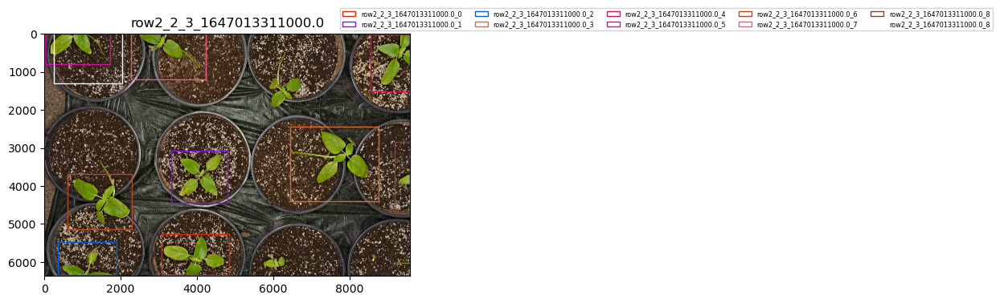

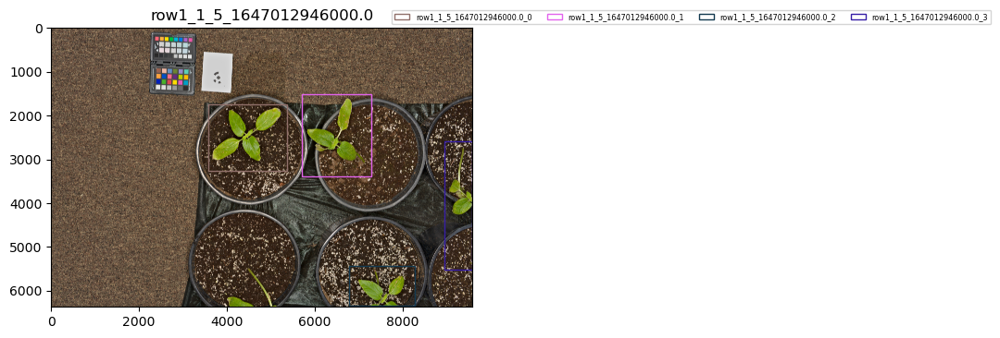

row2_2_6_1647013367000.0


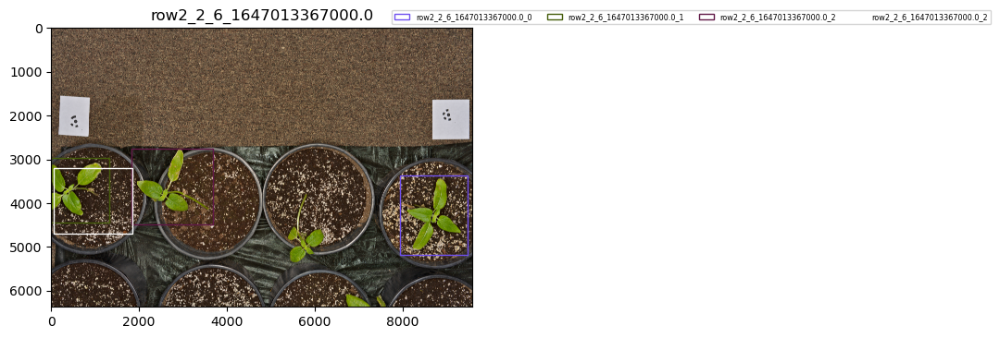

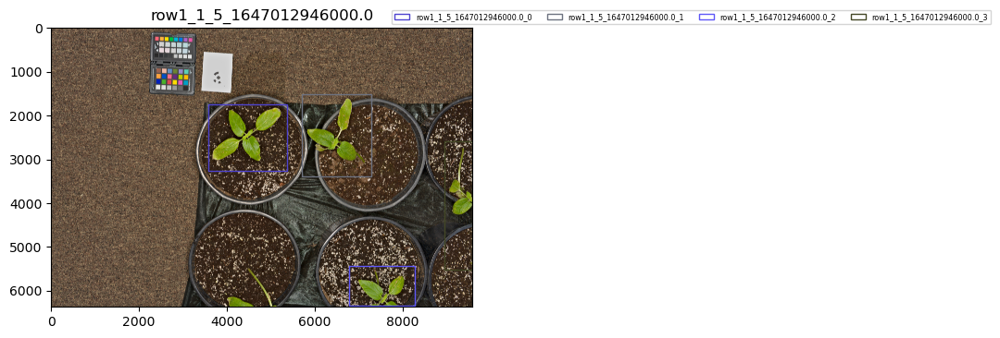

row1_1_4_1647012928000.0


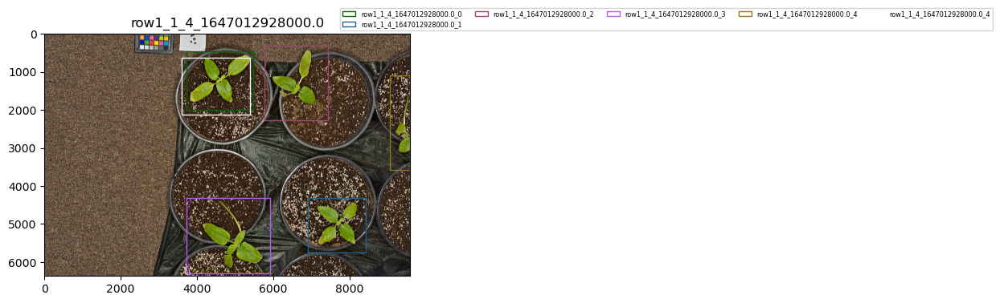

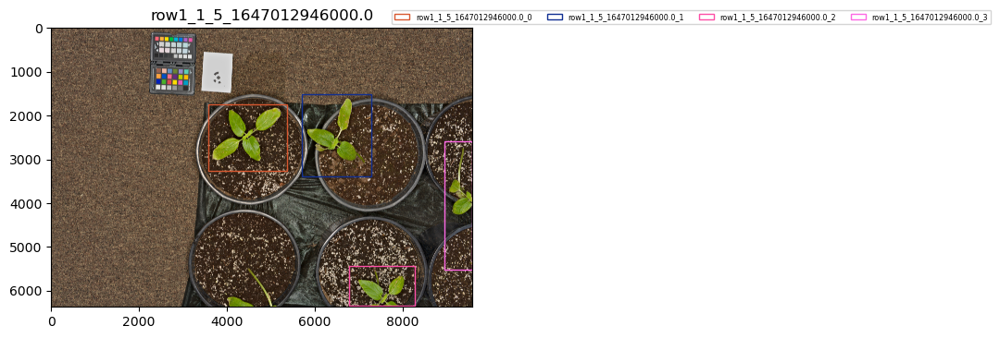

row2_2_5_1647013349000.0


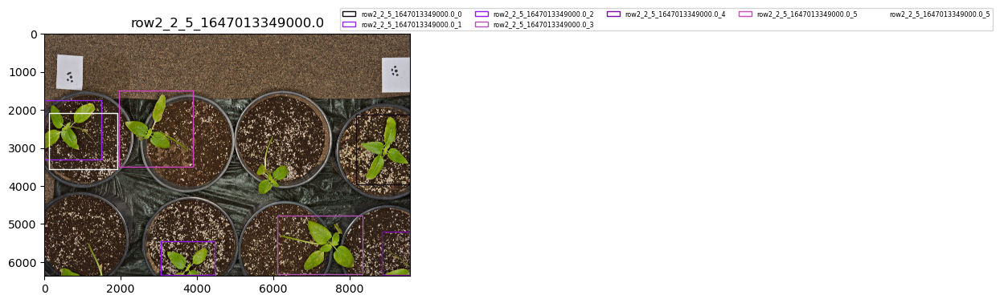

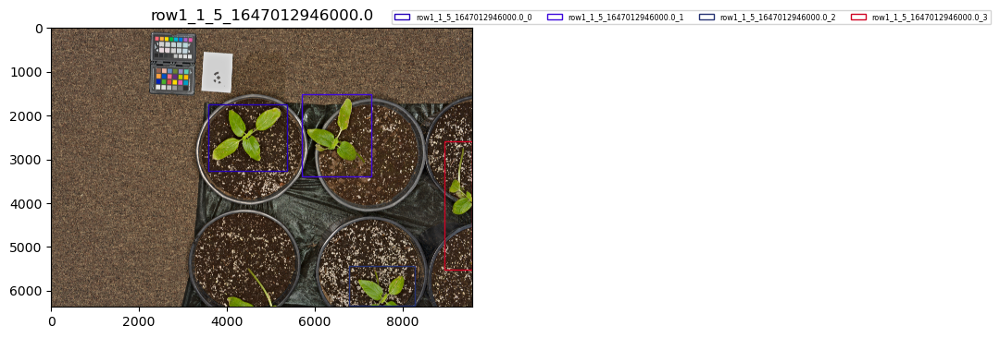

row1_1_6_1647012965000.0


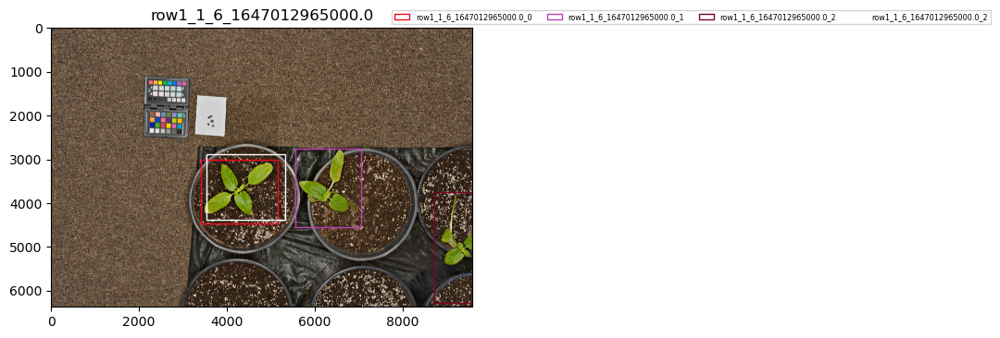

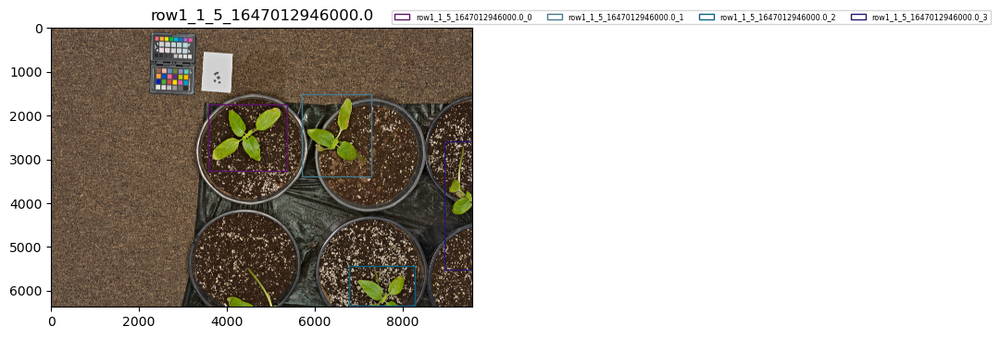

row1_1_3_1647012909000.0


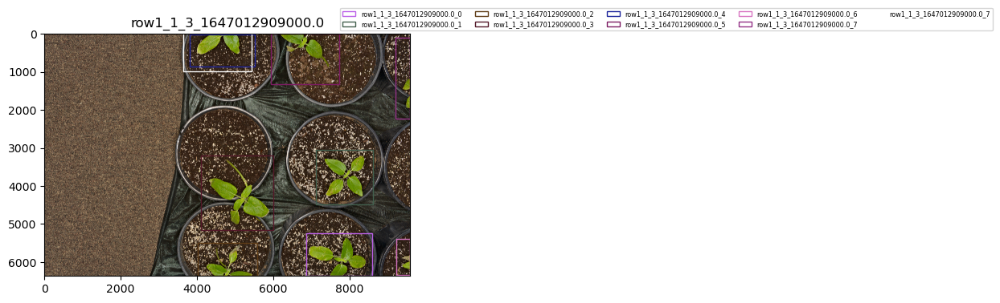

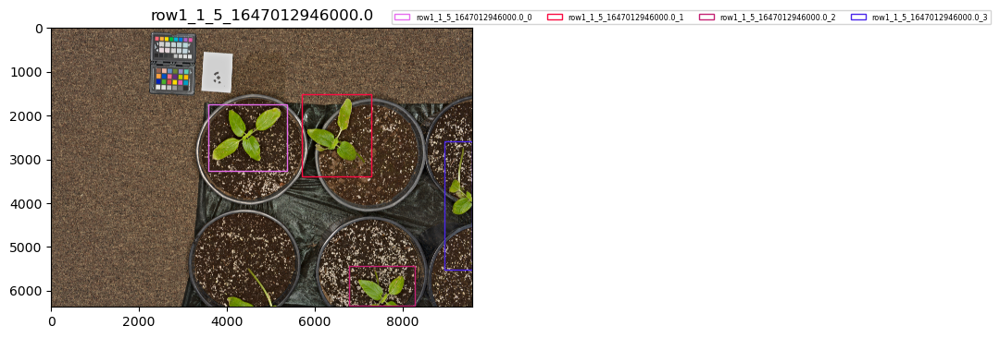

row2_2_4_1647013330000.0


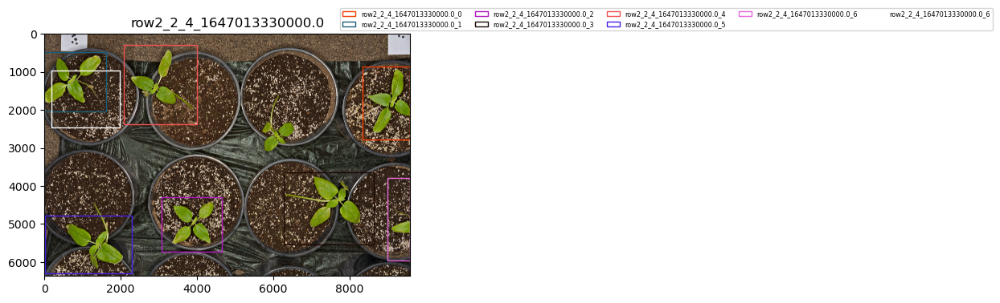

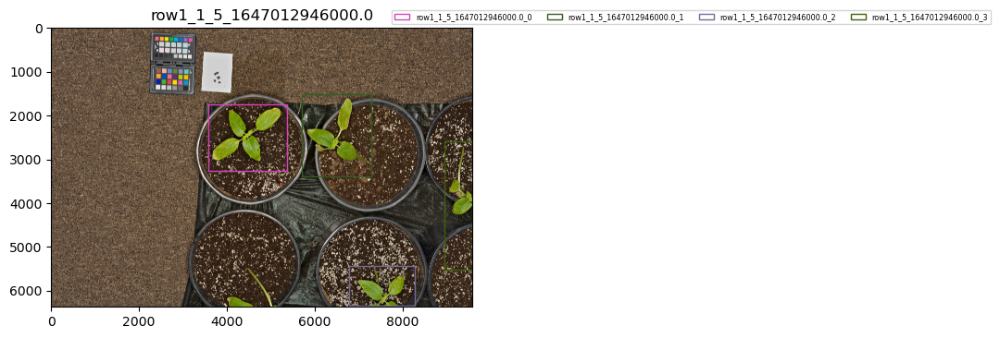

In [12]:
map_id = "row1_1_5_1647012946000.0"
map_bbox = "row1_1_5_1647012946000.0_0"

img = [img for img in images if img.image_id == map_id][0]
box = [_box for _box in img.bboxes if _box.bbox_id == map_bbox][0]

all_bbox_ids = box.overlapping_bbox_ids

for box_id in all_bbox_ids:
    
    mapto_id = box_id.rsplit("_", 1)[0]
    map_and_plot(img, box, mapto_id, box_id)